In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
from gstatot import utils, StatOT
import matplotlib.pyplot as plt
import jax.numpy as jnp
import gc

In [2]:
data_dir = "../../data/hemo_data"
adata = sc.read_h5ad(data_dir + "/GSE189161_integrated.h5ad")
adata

AnnData object with n_obs × n_vars = 58041 × 41569
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Cell', 'seurat_clusters', 'cluster_name'
    var: 'gene_symbols', 'highly_variable'
    obsm: 'X_pca', 'X_umap', 'seurat_integrated'

In [3]:
metadata_path = './metadata'
ages = pd.read_csv(f'{metadata_path}/ages.csv', index_col=0)
sinks = pd.read_csv(f'{metadata_path}/sinks.csv', index_col=0)
meta_cluster = pd.read_csv(f'{metadata_path}/meta_cluster.csv', index_col=0)
adata.obs['age'] = ages.loc[adata.obs_names, 'age']
adata.obs['sink'] = sinks.loc[adata.obs_names, 'sink']

print('Cluster Names:', np.unique(adata.obs['cluster_name']))
# remap cell types to more general categories
cell_type_map = {
    'G-Prog' : 'Granulocyte',
    'Baso/Mast': 'Baso/Mast',
    'E-Prog' : 'Erythroid',
    'pDC' : 'Mono/DC',
    'Mono/cDC' : 'Mono/DC',
    'Mk-Prog' : 'Megakaryocyte',
    'MPP' : 'HSC/MPP',
    'HSC' : 'HSC/MPP',
    'Ly-' : 'Lymphoid',
    'G/Mono' : 'Granulocyte',
}
def assign_cell_type(cluster_name):
    for key in cell_type_map:
        if key in cluster_name:
            return cell_type_map[key]

adata.obs['cell_type'] = adata.obs['cluster_name'].apply(assign_cell_type)

print(np.sum((adata.obs['sink'] == 1) & (adata.obs['cell_type'] == 'HSC/MPP')))
adata.obs.loc[(adata.obs['sink'] == 1) & (adata.obs['cell_type'] == 'HSC/MPP'), 'sink'] = False # correct miss labeled sinks

terminal_lineages = np.asarray([celltype for celltype in adata.obs['cell_type'].unique() if (np.sum((adata.obs['sink'] == 1) & (adata.obs['cell_type'] == celltype)) > 0)])
print("Terminal lineages:", terminal_lineages)
adata.uns['terminal_lineages'] = terminal_lineages 


Cluster Names: ['Baso/Mast-Prog' 'E-Prog-1' 'E-Prog-2' 'E-Prog-3' 'G-Prog-1' 'G-Prog-2'
 'G-Prog-3' 'G/Mono-Prog' 'HSC' 'Ly-Prog-1' 'Ly-Prog-2' 'Ly-Prog-3'
 'Ly-Prog-4' 'Ly-Prog-5' 'MPP-1' 'MPP-2' 'MPP-3' 'Mk-Prog' 'Mk/E-MPP'
 'Mono/cDC-Prog' 'My-MPP' 'pDC-Prog']
25
Terminal lineages: ['Granulocyte' 'Lymphoid' 'Mono/DC' 'Erythroid' 'Megakaryocyte'
 'Baso/Mast']


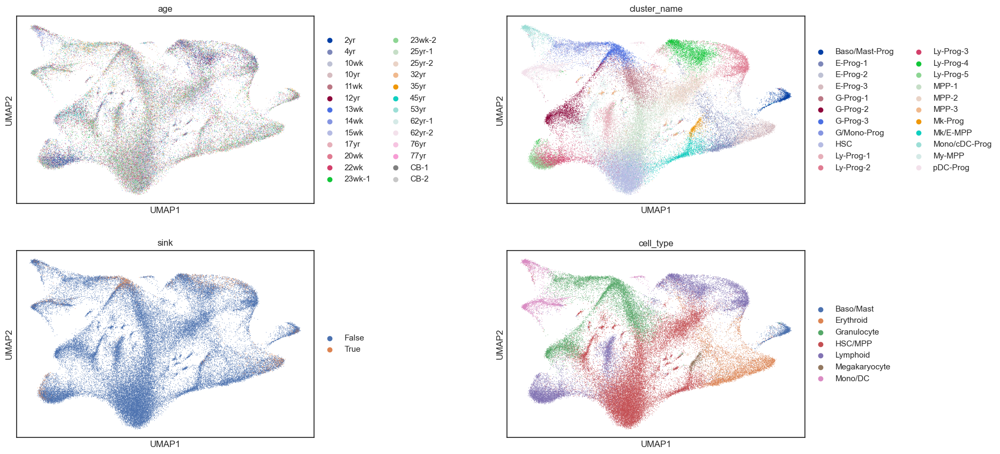

In [4]:
sc.pl.umap(adata, color=['age', 'cluster_name', 'sink', 'cell_type'], ncols=2, wspace=0.5)

In [5]:
# prenatal data
prenatal_adata = adata[adata.obs['age'].str.contains('wk'), :].copy()
prenatal_adata.obs['age_wks'] = prenatal_adata.obs['age'].apply(lambda x: float(x.split('wk')[0]))
prenatal_times = np.unique(prenatal_adata.obs['age_wks'])

# postnatal data
postnatal_adata = adata[(adata.obs['age'].str.contains('yr')) | (adata.obs['age'].str.contains('CB')), :].copy()
postnatal_adata.obs['age_yrs'] = postnatal_adata.obs['age'].apply(lambda x: float(x.split('yr')[0]) if 'yr' in x else 0)
postnatal_times = np.unique(postnatal_adata.obs['age_yrs'])

In [6]:
dt = 0.25
sink_growth = 1e-5 # sink removal
num_traj = 5_000

def apply_growth_rates(adata, ages, sink_growth, dt, time_key='age_yrs'):
    adata.obs['growth'] = 1.0
    adata.obs['growth_rate'] = 0.0
    sink_gr = np.log(sink_growth) / dt

    for a in ages:
        order_ind = (adata.obs[time_key] == a)
        sink_ind = order_ind & (adata.obs['sink'] == True)

        adata.obs.loc[sink_ind, 'growth'] = sink_growth
        adata.obs.loc[sink_ind, 'growth_rate']  = sink_gr

        G = adata.obs.loc[order_ind, 'growth'].values
        G = G / G.sum() * np.sum(order_ind)
        GR = np.log(G) / dt
        print("source growth rate: ", GR[GR>0][0])
        adata.obs.loc[order_ind, 'growth_rate'] = GR
        adata.obs.loc[order_ind, 'growth'] = G

apply_growth_rates(prenatal_adata, prenatal_times, sink_growth, dt, time_key='age_wks')
apply_growth_rates(postnatal_adata, postnatal_times, sink_growth, dt, time_key='age_yrs')

source growth rate:  0.16243272082089677
source growth rate:  0.2292867645500051
source growth rate:  0.21626666285949844
source growth rate:  0.17740688147131212
source growth rate:  0.16950790301467888
source growth rate:  0.2034838602395361
source growth rate:  0.16609471784678087
source growth rate:  0.1764841692213999
source growth rate:  0.11095658159631687
source growth rate:  0.3230716605973098
source growth rate:  0.10911640749211031
source growth rate:  0.24867911878422133
source growth rate:  0.16842630751480445
source growth rate:  0.576992228486451
source growth rate:  0.12645147726774578
source growth rate:  0.11482804436140977
source growth rate:  0.2092093945624615
source growth rate:  0.1491758198368662
source growth rate:  0.17614407059761053
source growth rate:  0.3204542428847559
source growth rate:  0.35084721806924013
source growth rate:  0.4429252268008596


In [7]:
# for future downstream analyses 
sc.pp.normalize_total(prenatal_adata, target_sum=1e4)
sc.pp.log1p(prenatal_adata)
sc.pp.normalize_total(postnatal_adata, target_sum=1e4)
sc.pp.log1p(postnatal_adata)

In [8]:
prenatal_StatOT_adata = prenatal_adata.copy()
prenatal_PBA_adata = prenatal_adata.copy()
postnatal_StatOT_adata = postnatal_adata.copy()
postnatal_PBA_adata = postnatal_adata.copy()

del adata
del prenatal_adata
del postnatal_adata
gc.collect()

28413

In [9]:
adata_keys  = {'time_key': 'age_wks',
               'cell_type_key': 'cell_type',
               'growth_rate_key': 'growth_rate',
               'embed_key': 'X_pca'}

sOT_params = {'epsilon': 0.04,
              'lse': True,
              'cost_scaling': 'mean'}

SOT_prenatal = StatOT(adata=prenatal_StatOT_adata, adata_keys=adata_keys, dt=dt, dtype=jnp.float32)

SOT_prenatal.fit(model_params=sOT_params, max_iter=10_000, verbose=True, inner_iter=1000)

SOT_prenatal.get_lin_fate_probs(label_key=adata_keys['cell_type_key'], 
                                all_labels=terminal_lineages)

Cost scaled by  mean
Time 10.0, ran 1000 iterations, inf norm error: 1.3970e-09
Time 11.0, ran 1000 iterations, inf norm error: 1.2806e-09
Time 13.0, ran 1000 iterations, inf norm error: 1.5716e-09
Time 14.0, ran 1000 iterations, inf norm error: 7.8289e-09
Time 15.0, ran 1000 iterations, inf norm error: 6.1406e-06
Time 20.0, ran 1000 iterations, inf norm error: 3.8941e-08
Time 22.0, ran 1000 iterations, inf norm error: 7.4506e-09
Time 23.0, ran 1000 iterations, inf norm error: 1.4887e-08


Age 10.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.02 %
 Coverage: 99.41 %
Age 11.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.02 %
 Coverage: 99.94 %
Age 13.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 99.84 %
Age 14.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.02 %
 Coverage: 99.78 %
Age 15.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.02 %
 Coverage: 99.33 %
Age 20.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 99.65 %
Age 22.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.06 %
 Coverage: 99.88 %
Age 23.0 : Steps to reach sink
Length of flows: 200 steps
Percentage 

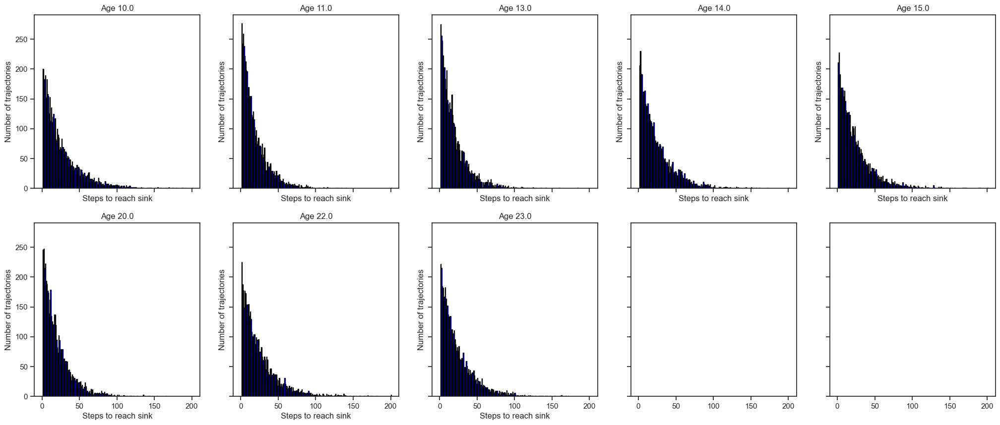

In [10]:
# large run to get percentiles of hitting time
traj_len = SOT_prenatal.get_trajectories(num_step=200, num_traj=num_traj, plot_hitting_time=True, return_traj_len=True)

In [11]:
percentile = 80
per_traj_lens = [] 
for i in range(len(prenatal_times)):
    per_t_len = int(np.percentile(traj_len[i], percentile))
    print(f"{percentile}th percentile trajectory length for prenatal age {prenatal_times[i]} wks: {per_t_len}")
    per_traj_lens.append(per_t_len)


80th percentile trajectory length for prenatal age 10.0 wks: 41
80th percentile trajectory length for prenatal age 11.0 wks: 29
80th percentile trajectory length for prenatal age 13.0 wks: 30
80th percentile trajectory length for prenatal age 14.0 wks: 38
80th percentile trajectory length for prenatal age 15.0 wks: 37
80th percentile trajectory length for prenatal age 20.0 wks: 32
80th percentile trajectory length for prenatal age 22.0 wks: 39
80th percentile trajectory length for prenatal age 23.0 wks: 38


Age 10.0 : Steps to reach sink
Length of flows: 41 steps
Percentage of particles that did not reach sink: 20.64 %
 Coverage: 99.33 %
Age 11.0 : Steps to reach sink
Length of flows: 29 steps
Percentage of particles that did not reach sink: 20.32 %
 Coverage: 99.89 %
Age 13.0 : Steps to reach sink
Length of flows: 30 steps
Percentage of particles that did not reach sink: 20.90 %
 Coverage: 99.79 %
Age 14.0 : Steps to reach sink
Length of flows: 38 steps
Percentage of particles that did not reach sink: 20.42 %
 Coverage: 99.78 %
Age 15.0 : Steps to reach sink
Length of flows: 37 steps
Percentage of particles that did not reach sink: 20.16 %
 Coverage: 99.29 %
Age 20.0 : Steps to reach sink
Length of flows: 32 steps
Percentage of particles that did not reach sink: 20.24 %
 Coverage: 99.60 %
Age 22.0 : Steps to reach sink
Length of flows: 39 steps
Percentage of particles that did not reach sink: 20.60 %
 Coverage: 99.88 %
Age 23.0 : Steps to reach sink
Length of flows: 38 steps
Percentage o

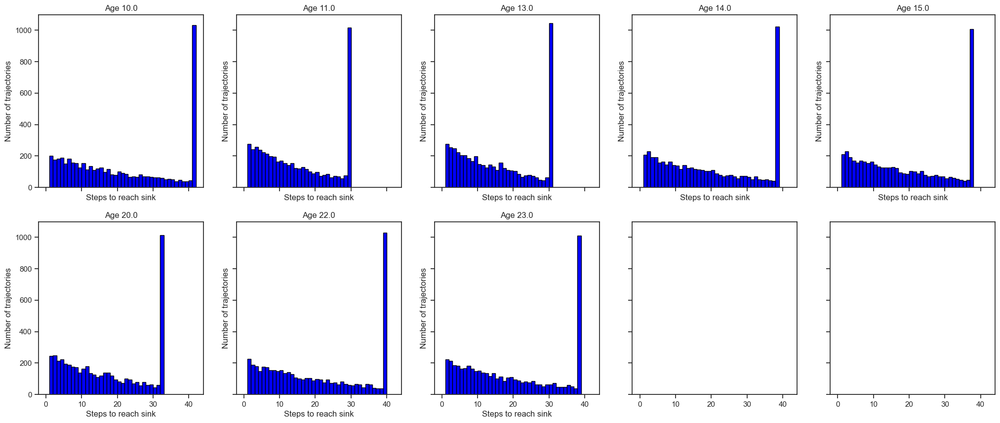

In [12]:
SOT_prenatal.get_trajectories(num_step=per_traj_lens, num_traj=num_traj, plot_hitting_time=True)

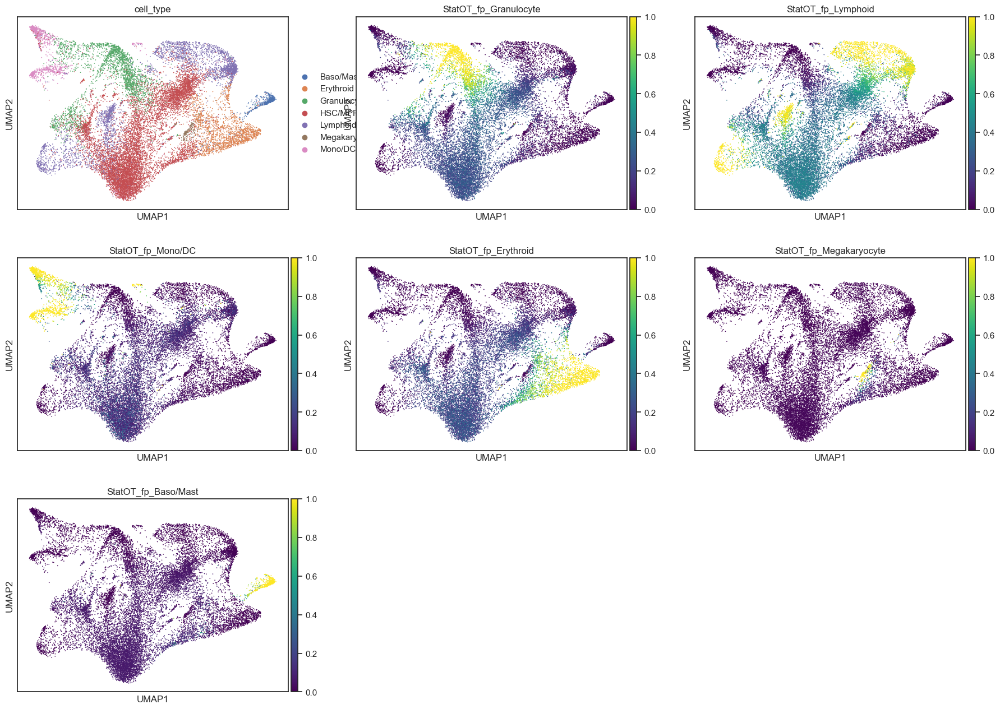

In [13]:
StatOT_adata = SOT_prenatal.adata
terminal_lineages = terminal_lineages 
for i, ct in enumerate(terminal_lineages):
    StatOT_adata.obs[f'StatOT_fp_{ct}'] = StatOT_adata.obsm['cell_type_fp'][:, i]

sc.pl.umap(StatOT_adata, color=['cell_type'] + [f'StatOT_fp_{ct}' for ct in terminal_lineages], ncols=3, cmap='viridis')

In [14]:
SOT_prenatal.adata.uns['true_traj_data'] = SOT_prenatal.adata.uns['StatOT_traj_data']
del SOT_prenatal.adata.uns['StatOT_traj_data']
SOT_prenatal.adata.uns['true_dt'] = dt
SOT_prenatal.adata.write_h5ad(f'{data_dir}/prenatal_integrated_StatOT_fitted.h5ad')

/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


In [15]:
from gstatot import PBA
script_path = '../../../../PBA'
pba_save_dir = './pba_outputs'
py2_path = '../../../../../.pyenv/versions/2.7.18/bin/python2.7'

k = 20
D = 1
prenatal_PBA_adata.obs['growth_rate'] = 0.0

for age in prenatal_times:

    prenatal_PBA_adata.obs.loc[(prenatal_PBA_adata.obs['age_wks']==age) & (prenatal_PBA_adata.obs['sink'] == True), 'growth_rate'] =  -1/D 
    total_growth = prenatal_PBA_adata.obs.loc[prenatal_PBA_adata.obs['age_wks']==age, 'growth_rate'].sum()
    prenatal_PBA_adata.obs.loc[(prenatal_PBA_adata.obs['age_wks']==age) & (prenatal_PBA_adata.obs['sink'] == False), 'growth_rate'] = - (total_growth / np.sum((prenatal_PBA_adata.obs['age_wks']==age) & (prenatal_PBA_adata.obs['sink'] == False)))
    total_growth_check = prenatal_PBA_adata.obs.loc[prenatal_PBA_adata.obs['age_wks']==age, 'growth_rate'].sum()
    print(f"Total growth rate after adjustment at age {age}: {total_growth_check}")

prenatal_PBA_adata.uns['all_cell_types'] = np.array(terminal_lineages)
PBA_prenatal = PBA(adata=prenatal_PBA_adata, adata_keys=adata_keys, 
                   script_path=script_path, save_dir=pba_save_dir,
                   k=k, D=D, 
                   py2_path=py2_path, 
                   verbose=True,
                   use_pca=True
                   )

Total growth rate after adjustment at age 10.0: -2.1316282072803006e-14
Total growth rate after adjustment at age 11.0: -3.9968028886505635e-14
Total growth rate after adjustment at age 13.0: 2.220446049250313e-14
Total growth rate after adjustment at age 14.0: 2.1316282072803006e-14
Total growth rate after adjustment at age 15.0: 2.4868995751603507e-14
Total growth rate after adjustment at age 20.0: 2.4868995751603507e-14
Total growth rate after adjustment at age 22.0: -1.199040866595169e-14
Total growth rate after adjustment at age 23.0: -7.105427357601002e-15

## Running compute_knn_graph.py
Loading expression data
Filtering and normalization
Performing PCA
Computing distance matrix
Getting knn edges

## Running compute_Linv.py
Making Laplancian matrix
Inverting the Laplacian

## Running compute_potential.py
Computing the potential V

## Running compute_fate_probabilities.py
Making Markov chain transition matrix
Computing fundamental matrix

## Running compute_knn_graph.py
Loading e

Age 10.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 1.36 %
 Coverage: 100.00 %
Age 11.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 0.80 %
 Coverage: 100.00 %
Age 13.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 1.44 %
 Coverage: 99.95 %
Age 14.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 2.00 %
 Coverage: 100.00 %
Age 15.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 42.96 %
 Coverage: 99.50 %
Age 20.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 0.30 %
 Coverage: 99.55 %
Age 22.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of particles that did not reach sink: 1.70 %
 Coverage: 100.00 %
Age 23.0 : Steps to reach sink
Length of flows: 50 steps
Percentage of 

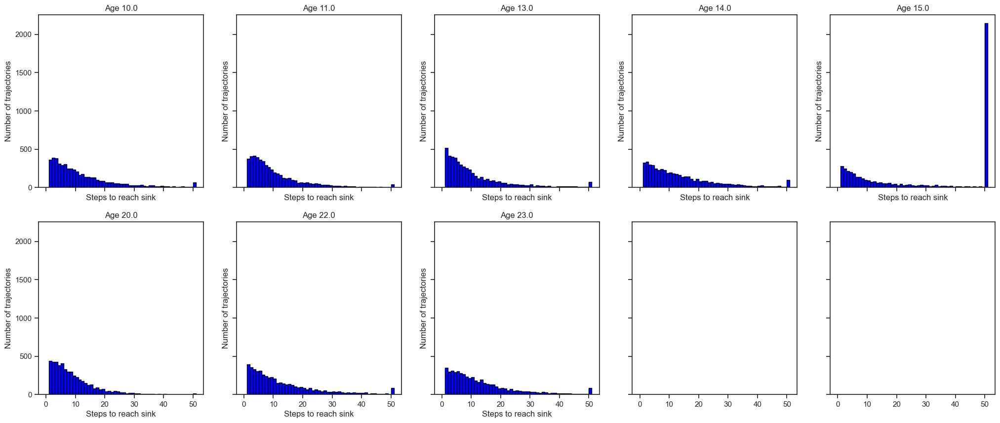

In [16]:
PBA_pre_traj_len = PBA_prenatal.get_trajectories(num_step=50, num_traj=num_traj, plot_hitting_time=True, return_traj_len=True)

80th percentile trajectory length for prenatal age 10.0 wks: 18
80th percentile trajectory length for prenatal age 11.0 wks: 16
80th percentile trajectory length for prenatal age 13.0 wks: 17
80th percentile trajectory length for prenatal age 14.0 wks: 22
80th percentile trajectory length for prenatal age 15.0 wks: 51
80th percentile trajectory length for prenatal age 20.0 wks: 13
80th percentile trajectory length for prenatal age 22.0 wks: 20
80th percentile trajectory length for prenatal age 23.0 wks: 19
Age 10.0 : Steps to reach sink
Length of flows: 18 steps
Percentage of particles that did not reach sink: 21.06 %
 Coverage: 100.00 %
Age 11.0 : Steps to reach sink
Length of flows: 16 steps
Percentage of particles that did not reach sink: 20.24 %
 Coverage: 100.00 %
Age 13.0 : Steps to reach sink
Length of flows: 17 steps
Percentage of particles that did not reach sink: 20.10 %
 Coverage: 99.95 %
Age 14.0 : Steps to reach sink
Length of flows: 22 steps
Percentage of particles that d

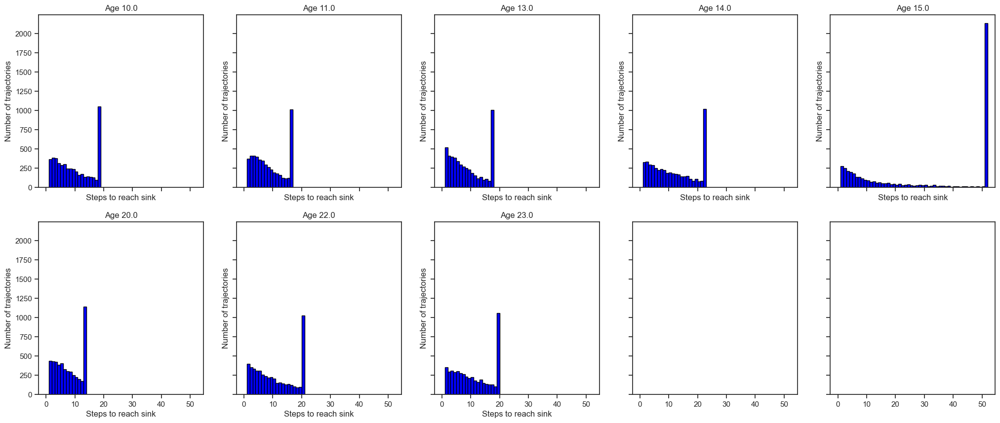

In [17]:
percentile = 80
per_traj_lens = [] 
for i in range(len(prenatal_times)):
    per_t_len = int(np.percentile(PBA_pre_traj_len[i], percentile))
    print(f"{percentile}th percentile trajectory length for prenatal age {prenatal_times[i]} wks: {per_t_len}")
    per_traj_lens.append(per_t_len)

PBA_prenatal.get_trajectories(num_step=per_traj_lens, num_traj=num_traj, plot_hitting_time=True)

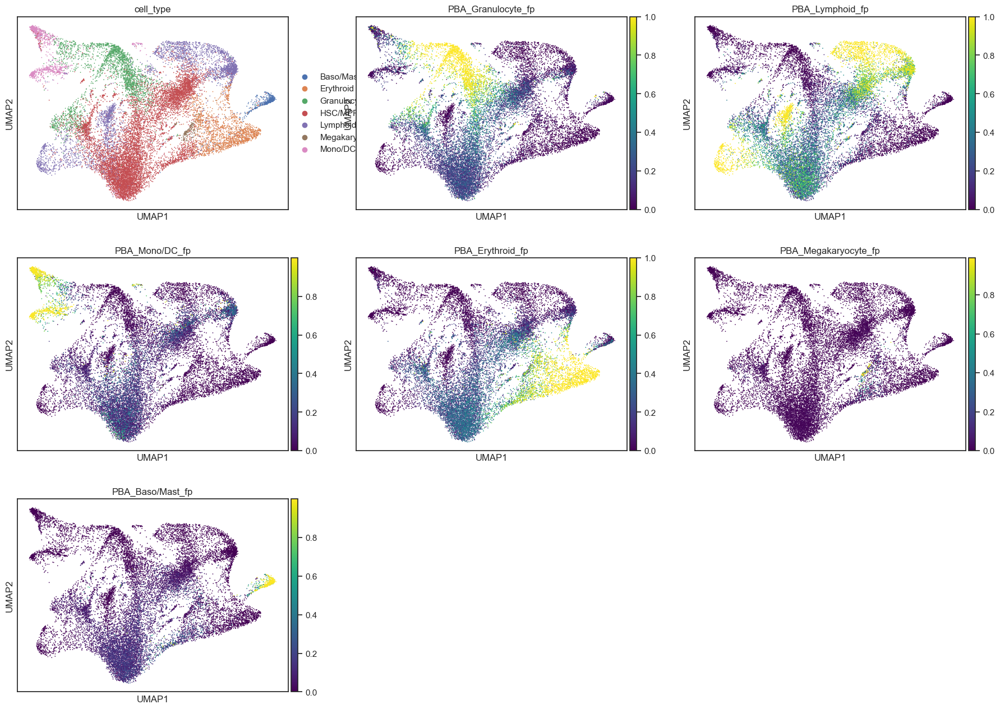

In [18]:
sc.pl.umap(PBA_prenatal.adata, color=['cell_type'] + [f'PBA_{ct}_fp' for ct in terminal_lineages], ncols=3, cmap='viridis')

In [19]:
PBA_prenatal.adata.uns['true_traj_data'] = PBA_prenatal.adata.uns['PBA_traj_data']
del PBA_prenatal.adata.uns['PBA_traj_data']
PBA_prenatal.adata.uns['true_dt'] = dt
PBA_prenatal.adata.write_h5ad(f'{data_dir}/prenatal_integrated_PBA_fitted.h5ad')

/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


/tmp/ipykernel_585701/32350727.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
/tmp/ipykernel_585701/32350727.py:57: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)


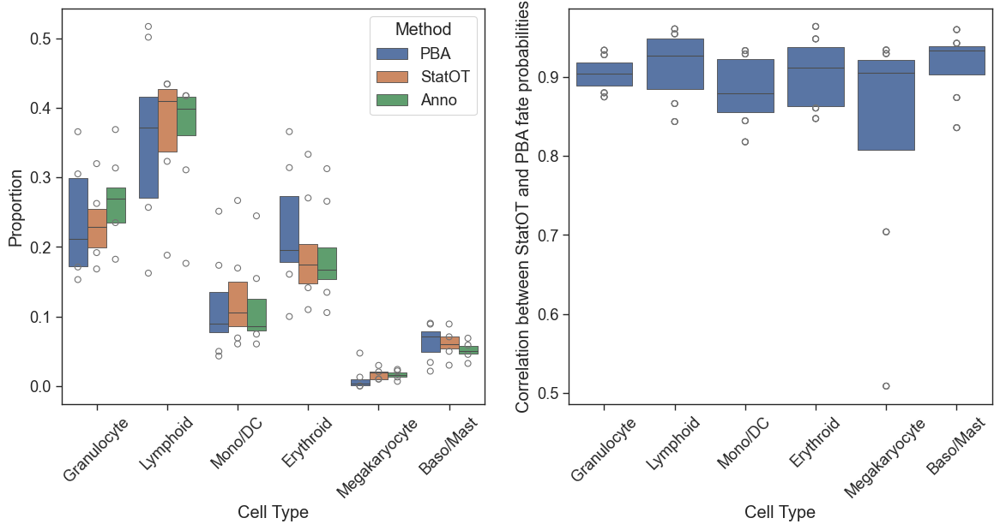

In [20]:
res = {'age': [], 'celltype' : [], 'total': [], 'method': [], 'corr': []}

for ct in terminal_lineages:
    if ct == '':
        continue
    for t in prenatal_times:
        adata_t = prenatal_StatOT_adata[prenatal_StatOT_adata.obs['age_wks'] == t] 
        annos_counts = adata_t.obs['cell_type'].value_counts()
        annos_terminal = annos_counts[annos_counts.index.isin(terminal_lineages)]

        statOT_fp = StatOT_adata[StatOT_adata.obs['age_wks'] == t].obs[f'StatOT_fp_{ct}'].values
        pba_fp = PBA_prenatal.adata[PBA_prenatal.adata.obs['age_wks'] == t].obs[f'PBA_{ct}_fp'].values
        corr = np.corrcoef(statOT_fp, pba_fp)[0, 1]

        res['age'].append(t)
        res['celltype'].append(ct)
        res['total'].append(pba_fp.sum())
        res['method'].append('PBA')
        res['corr'].append(corr)

        res['age'].append(t)
        res['celltype'].append(ct)
        res['total'].append(statOT_fp.sum())
        res['method'].append('StatOT')
        res['corr'].append(corr)

        res['age'].append(t)
        res['celltype'].append(ct)
        res['total'].append(annos_terminal[ct] if ct in annos_terminal.index else 0)
        res['method'].append('Anno')
        res['corr'].append(corr)
    

res_df = pd.DataFrame(res)

cell_types_agg = res_df['celltype'].unique()

for ct in cell_types_agg:
    for t in prenatal_times:
        for method in ['PBA', 'StatOT', 'Anno']:
            total = res_df[(res_df['age'] == t) & (res_df['celltype'] == ct) & (res_df['method'] == method)]['total'].values
            res_df.loc[(res_df['age'] == t) & (res_df['celltype'] == ct) & (res_df['method'] == method), 'prop'] = total / res_df[(res_df['age'] == t) & (res_df['method'] == method)]['total'].sum()

import seaborn as sns
sns.set_style('ticks')
sns.set_context('paper', font_scale=1.5)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.boxenplot(data=res_df, x='celltype', y='prop', hue='method', ax=ax1)
ax1.legend(title='Method', loc='upper right')
ax1.set_ylabel('Proportion')
ax1.set_xlabel('Cell Type')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)

sns.boxenplot(data=res_df, x='celltype', y='corr', ax=ax2)
ax2.set_ylabel('Correlation between StatOT and PBA fate probabilities')
ax2.set_xlabel('Cell Type')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
plt.savefig('./pre_PBA_SOT_prop_corr.png', dpi=350, bbox_inches='tight')
plt.show()


# Postnatal

In [21]:
adata_keys  = {'time_key': 'age_yrs',
               'cell_type_key': 'cell_type',
               'growth_rate_key': 'growth_rate',
               'embed_key': 'X_pca'}

sOT_params = {'epsilon': 0.04,
              'lse': True,
              'cost_scaling': 'mean'}

sOT_postnatal = StatOT(adata=postnatal_StatOT_adata, adata_keys=adata_keys, dt=dt, dtype=jnp.float32)
sOT_postnatal.fit(model_params=sOT_params, max_iter=10_000, verbose=True, inner_iter=1000)

sOT_postnatal.get_lin_fate_probs(label_key=adata_keys['cell_type_key'], 
                                all_labels=terminal_lineages)

Cost scaled by  mean
Time 0.0, ran 1000 iterations, inf norm error: 4.0063e-06
Time 2.0, ran 1000 iterations, inf norm error: 1.0770e-06
Time 4.0, ran 1000 iterations, inf norm error: 7.4425e-06
Time 10.0, ran 1000 iterations, inf norm error: 1.5601e-06
Time 12.0, ran 1000 iterations, inf norm error: 2.2120e-06
Time 17.0, ran 1000 iterations, inf norm error: 8.1491e-09
Time 25.0, ran 1000 iterations, inf norm error: 1.0272e-07
Time 32.0, ran 1000 iterations, inf norm error: 8.4094e-06
Time 35.0, ran 1000 iterations, inf norm error: 4.1159e-07
Time 45.0, ran 1000 iterations, inf norm error: 6.6878e-07
Time 53.0, ran 1000 iterations, inf norm error: 3.4069e-07
Time 62.0, ran 1000 iterations, inf norm error: 4.0745e-09
Time 76.0, ran 1000 iterations, inf norm error: 1.7462e-09
Time 77.0, ran 1000 iterations, inf norm error: 4.4223e-06


Age 0.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.44 %
 Coverage: 98.28 %
Age 2.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 100.00 %
Age 4.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.64 %
 Coverage: 98.87 %
Age 10.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 100.00 %
Age 12.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.02 %
 Coverage: 99.54 %
Age 17.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 100.00 %
Age 25.0 : Steps to reach sink
Length of flows: 200 steps
Percentage of particles that did not reach sink: 0.18 %
 Coverage: 97.87 %
Age 32.0 : Steps to reach sink
Length of flows: 200 steps
Percentage 

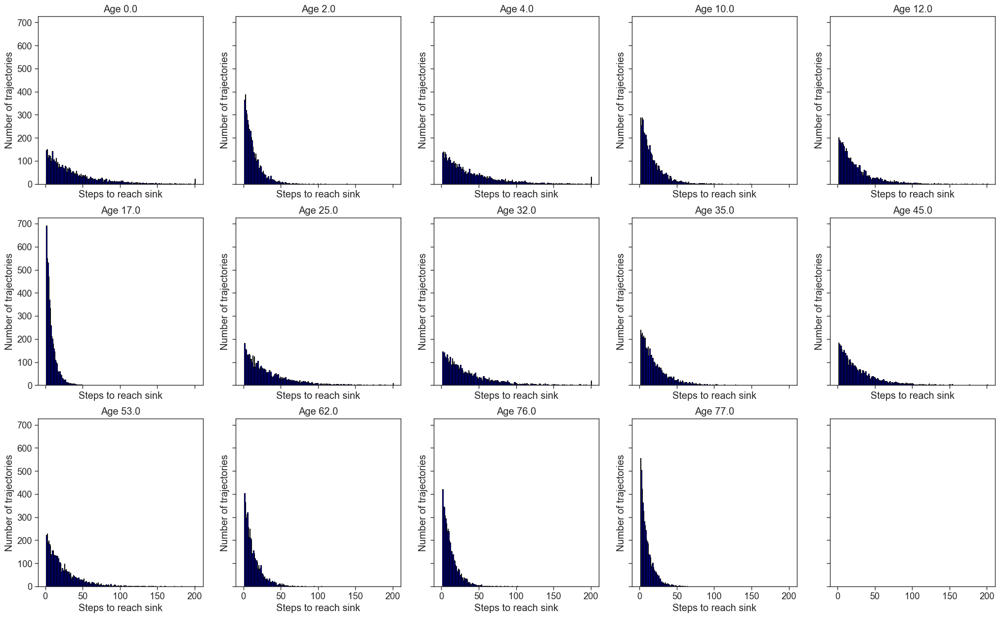

In [22]:
sot_traj_len_post = sOT_postnatal.get_trajectories(num_step=200, num_traj=num_traj, plot_hitting_time=True, return_traj_len=True)

80th percentile trajectory length for postnatal age 0.0 wks: 58
80th percentile trajectory length for postnatal age 2.0 wks: 20
80th percentile trajectory length for postnatal age 4.0 wks: 61
80th percentile trajectory length for postnatal age 10.0 wks: 26
80th percentile trajectory length for postnatal age 12.0 wks: 38
80th percentile trajectory length for postnatal age 17.0 wks: 12
80th percentile trajectory length for postnatal age 25.0 wks: 52
80th percentile trajectory length for postnatal age 32.0 wks: 56
80th percentile trajectory length for postnatal age 35.0 wks: 32
80th percentile trajectory length for postnatal age 45.0 wks: 44
80th percentile trajectory length for postnatal age 53.0 wks: 37
80th percentile trajectory length for postnatal age 62.0 wks: 20
80th percentile trajectory length for postnatal age 76.0 wks: 18
80th percentile trajectory length for postnatal age 77.0 wks: 15


Age 0.0 : Steps to reach sink
Length of flows: 58 steps
Percentage of particles that did not reach sink: 20.34 %
 Coverage: 97.99 %
Age 2.0 : Steps to reach sink
Length of flows: 20 steps
Percentage of particles that did not reach sink: 20.46 %
 Coverage: 100.00 %
Age 4.0 : Steps to reach sink
Length of flows: 61 steps
Percentage of particles that did not reach sink: 20.26 %
 Coverage: 98.68 %
Age 10.0 : Steps to reach sink
Length of flows: 26 steps
Percentage of particles that did not reach sink: 20.68 %
 Coverage: 100.00 %
Age 12.0 : Steps to reach sink
Length of flows: 38 steps
Percentage of particles that did not reach sink: 20.42 %
 Coverage: 99.50 %
Age 17.0 : Steps to reach sink
Length of flows: 12 steps
Percentage of particles that did not reach sink: 20.68 %
 Coverage: 100.00 %
Age 25.0 : Steps to reach sink
Length of flows: 52 steps
Percentage of particles that did not reach sink: 20.20 %
 Coverage: 97.37 %
Age 32.0 : Steps to reach sink
Length of flows: 56 steps
Percentage o

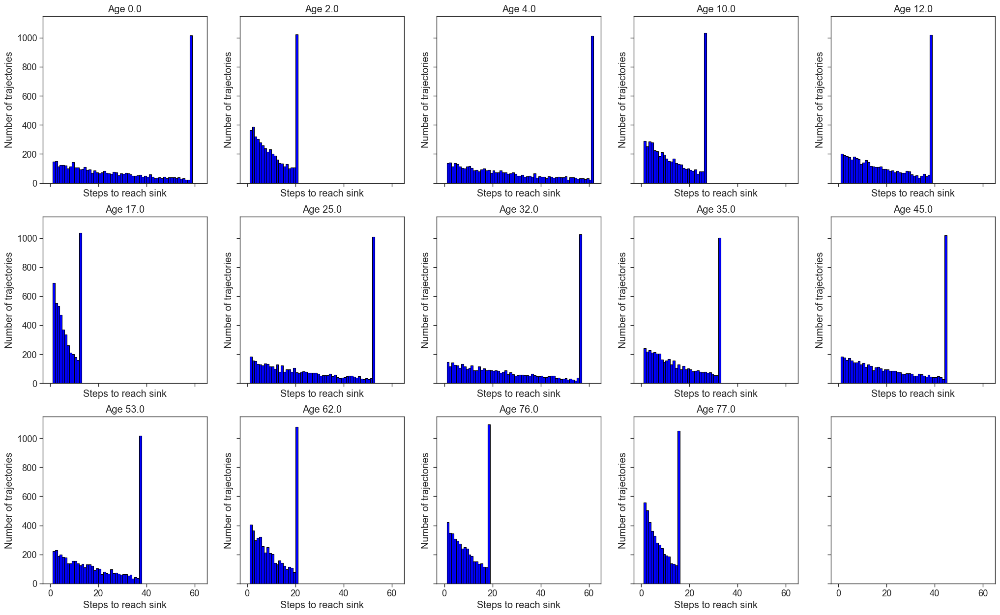

In [23]:
percentile = 80
per_traj_lens = [] 
for i in range(len(postnatal_times)):
    per_t_len = int(np.percentile(sot_traj_len_post[i], percentile))
    print(f"{percentile}th percentile trajectory length for postnatal age {postnatal_times[i]} wks: {per_t_len}")
    per_traj_lens.append(per_t_len)

sOT_postnatal.get_trajectories(num_step=per_traj_lens, num_traj=num_traj, plot_hitting_time=True)

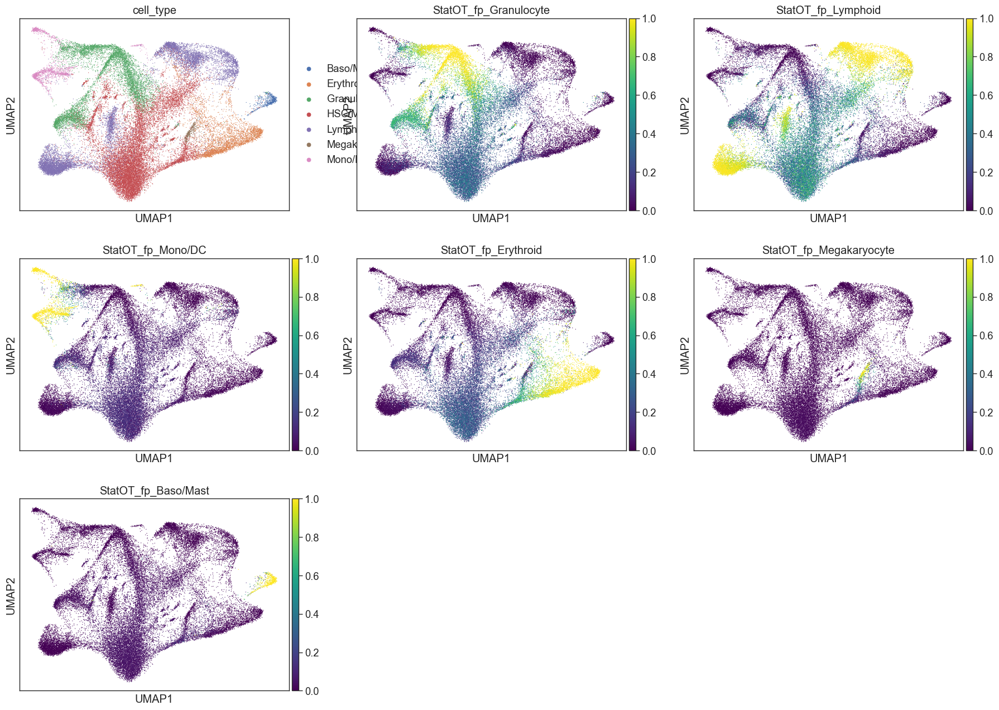

In [24]:
StatOT_adata = sOT_postnatal.adata
terminal_lineages = terminal_lineages 
for i, ct in enumerate(terminal_lineages):
    StatOT_adata.obs[f'StatOT_fp_{ct}'] = StatOT_adata.obsm['cell_type_fp'][:, i]

sc.pl.umap(StatOT_adata, color=['cell_type'] + [f'StatOT_fp_{ct}' for ct in terminal_lineages], ncols=3, cmap='viridis')

In [25]:
sOT_postnatal.adata.uns['true_traj_data'] = sOT_postnatal.adata.uns['StatOT_traj_data']
del sOT_postnatal.adata.uns['StatOT_traj_data']
sOT_postnatal.adata.uns['true_dt'] = dt
sOT_postnatal.adata.write_h5ad(f'{data_dir}/postnatal_integrated_StatOT_fitted.h5ad')

/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


In [26]:

from gstatot import PBA
script_path = '../../../../PBA'
pba_save_dir = './pba_outputs'
py2_path = '../../../../../.pyenv/versions/2.7.18/bin/python2.7'

k = 20
D = 1.0
postnatal_PBA_adata.obs['growth_rate'] = 0.0

for age in postnatal_times:

    postnatal_PBA_adata.obs.loc[(postnatal_PBA_adata.obs['age_yrs']==age) & (postnatal_PBA_adata.obs['sink'] == True), 'growth_rate'] =  -1/D 
    total_growth = postnatal_PBA_adata.obs.loc[postnatal_PBA_adata.obs['age_yrs']==age, 'growth_rate'].sum()
    postnatal_PBA_adata.obs.loc[(postnatal_PBA_adata.obs['age_yrs']==age) & (postnatal_PBA_adata.obs['sink'] == False), 'growth_rate'] = - (total_growth / np.sum((postnatal_PBA_adata.obs['age_yrs']==age) & (postnatal_PBA_adata.obs['sink'] == False)))
    total_growth_check = postnatal_PBA_adata.obs.loc[postnatal_PBA_adata.obs['age_yrs']==age, 'growth_rate'].sum()
    print(f"Total growth rate after adjustment at age {age}: {total_growth_check}")

postnatal_PBA_adata.uns['all_cell_types'] = np.array(terminal_lineages)
PBA_postnatal = PBA(adata=postnatal_PBA_adata, adata_keys=adata_keys, 
                   script_path=script_path, save_dir=pba_save_dir,
                   k=k, D=D, 
                   py2_path=py2_path, 
                   verbose=True,
                   use_pca=True)

Total growth rate after adjustment at age 0.0: 4.263256414560601e-14
Total growth rate after adjustment at age 2.0: 1.3322676295501878e-14
Total growth rate after adjustment at age 4.0: 1.865174681370263e-14
Total growth rate after adjustment at age 10.0: -3.108624468950438e-14
Total growth rate after adjustment at age 12.0: 1.0658141036401503e-14
Total growth rate after adjustment at age 17.0: -3.552713678800501e-15
Total growth rate after adjustment at age 25.0: 0.0
Total growth rate after adjustment at age 32.0: -1.7763568394002505e-15
Total growth rate after adjustment at age 35.0: -2.1316282072803006e-14
Total growth rate after adjustment at age 45.0: -1.4210854715202004e-14
Total growth rate after adjustment at age 53.0: -6.217248937900877e-15
Total growth rate after adjustment at age 62.0: -2.842170943040401e-14
Total growth rate after adjustment at age 76.0: -7.105427357601002e-15
Total growth rate after adjustment at age 77.0: -1.7763568394002505e-15



## Running compute_knn_graph.py
Loading expression data
Filtering and normalization
Performing PCA
Computing distance matrix
Getting knn edges

## Running compute_Linv.py
Making Laplancian matrix
Inverting the Laplacian

## Running compute_potential.py
Computing the potential V

## Running compute_fate_probabilities.py
Making Markov chain transition matrix
Computing fundamental matrix

## Running compute_knn_graph.py
Loading expression data
Filtering and normalization
Performing PCA
Computing distance matrix
Getting knn edges

## Running compute_Linv.py
Making Laplancian matrix
Inverting the Laplacian

## Running compute_potential.py
Computing the potential V

## Running compute_fate_probabilities.py
Making Markov chain transition matrix
Computing fundamental matrix

## Running compute_knn_graph.py
Loading expression data
Filtering and normalization
Performing PCA
Computing distance matrix
Getting knn edges

## Running compute_Linv.py
Making Laplancian matrix
Inverting the Laplacian



Age 0.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 0.72 %
 Coverage: 99.90 %
Age 2.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 100.00 %
Age 4.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 2.02 %
 Coverage: 100.00 %
Age 10.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 0.02 %
 Coverage: 100.00 %
Age 12.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 4.68 %
 Coverage: 100.00 %
Age 17.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 0.00 %
 Coverage: 100.00 %
Age 25.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of particles that did not reach sink: 0.14 %
 Coverage: 99.98 %
Age 32.0 : Steps to reach sink
Length of flows: 80 steps
Percentage of par

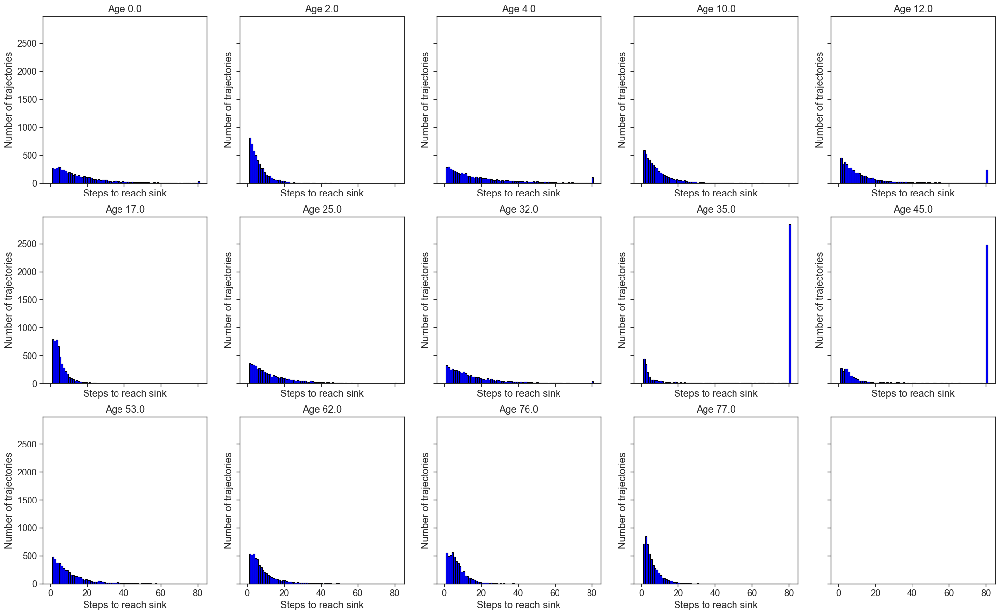

In [27]:
pba_traj_len_post = PBA_postnatal.get_trajectories(num_step=80, num_traj=num_traj, plot_hitting_time=True, return_traj_len=True)

80th percentile trajectory length for postnatal age 0.0 wks: 24
80th percentile trajectory length for postnatal age 2.0 wks: 9
80th percentile trajectory length for postnatal age 4.0 wks: 32
80th percentile trajectory length for postnatal age 10.0 wks: 13
80th percentile trajectory length for postnatal age 12.0 wks: 22
80th percentile trajectory length for postnatal age 17.0 wks: 7
80th percentile trajectory length for postnatal age 25.0 wks: 22
80th percentile trajectory length for postnatal age 32.0 wks: 26
80th percentile trajectory length for postnatal age 35.0 wks: 81
80th percentile trajectory length for postnatal age 45.0 wks: 81
80th percentile trajectory length for postnatal age 53.0 wks: 16
80th percentile trajectory length for postnatal age 62.0 wks: 13
80th percentile trajectory length for postnatal age 76.0 wks: 10
80th percentile trajectory length for postnatal age 77.0 wks: 8
Age 0.0 : Steps to reach sink
Length of flows: 24 steps
Percentage of particles that did not rea

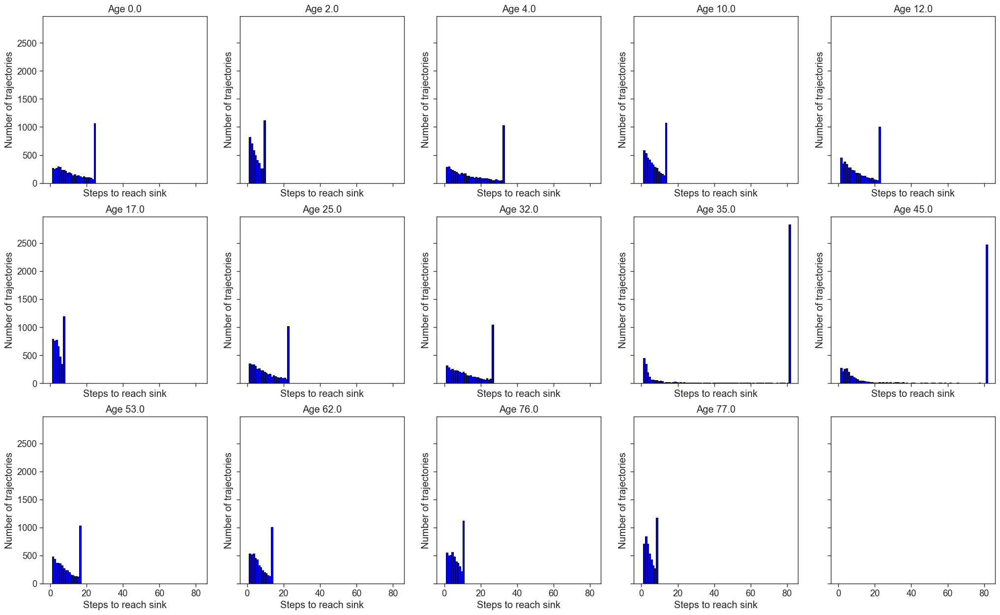

In [28]:
percentile = 80
per_traj_lens = [] 
for i in range(len(postnatal_times)):
    per_t_len = int(np.percentile(pba_traj_len_post[i], percentile))
    print(f"{percentile}th percentile trajectory length for postnatal age {postnatal_times[i]} wks: {per_t_len}")
    per_traj_lens.append(per_t_len)

PBA_postnatal.get_trajectories(num_step=per_traj_lens, num_traj=num_traj, plot_hitting_time=True)

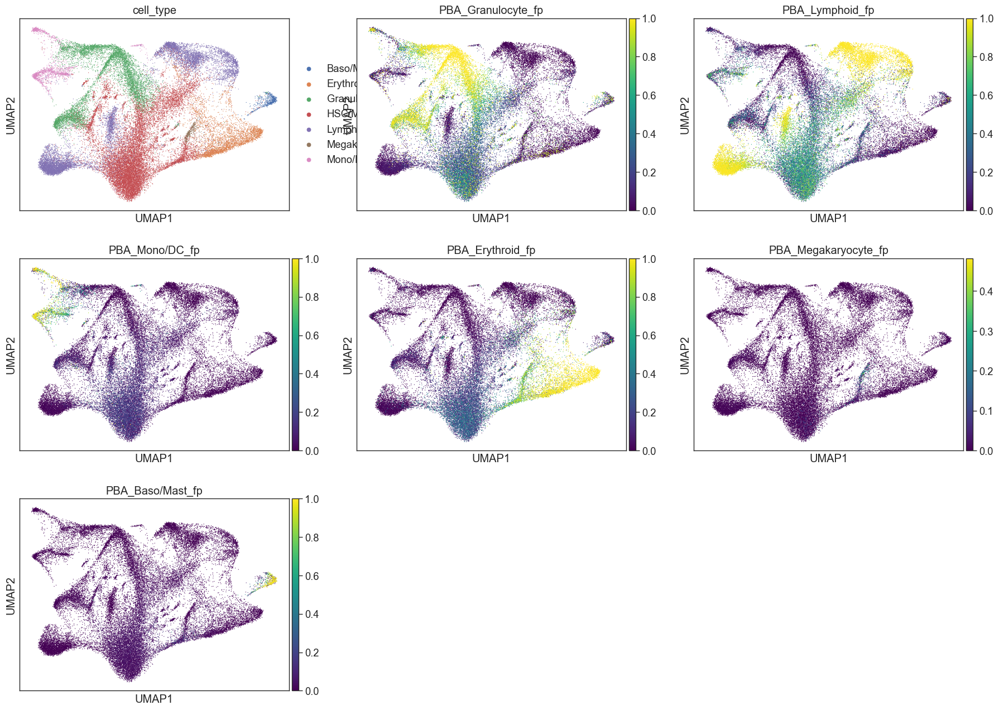

In [29]:
sc.pl.umap(PBA_postnatal.adata, color=['cell_type'] + [f'PBA_{ct}_fp' for ct in terminal_lineages], ncols=3, cmap='viridis')

In [30]:
PBA_postnatal.adata.uns['true_traj_data'] = PBA_postnatal.adata.uns['PBA_traj_data']
del PBA_postnatal.adata.uns['PBA_traj_data']
PBA_postnatal.adata.uns['true_dt'] = dt
PBA_postnatal.adata.write_h5ad(f'{data_dir}/postnatal_integrated_PBA_fitted.h5ad')

/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/anndata/_io/utils.py:272: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/cole/coding/global-stationaryOT/.gSOT_venv/lib/python3.13/site-packages/numpy/lib/_function_base_impl.py:3023: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/tmp/ipykernel_585701/662368710.py:50: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)
/tmp/ip

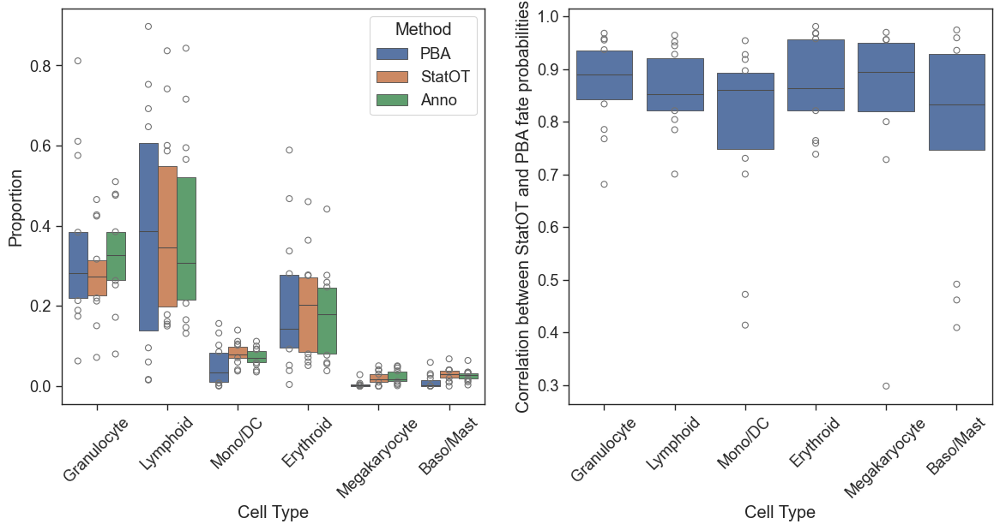

In [31]:
res = {'age': [], 'celltype' : [], 'total': [], 'method': [], 'corr': []}

for ct in terminal_lineages:
    for t in postnatal_times:
        adata_t = postnatal_StatOT_adata[postnatal_StatOT_adata.obs['age_yrs'] == t] 
        annos_counts = adata_t.obs['cell_type'].value_counts()
        annos_terminal = annos_counts[annos_counts.index.isin(terminal_lineages)]

        statOT_fp = postnatal_StatOT_adata[postnatal_StatOT_adata.obs['age_yrs'] == t].obs[f'StatOT_fp_{ct}'].values
        pba_fp = PBA_postnatal.adata[PBA_postnatal.adata.obs['age_yrs'] == t].obs[f'PBA_{ct}_fp'].values
        corr = np.corrcoef(statOT_fp, pba_fp)[0, 1]


        res['age'].append(t)
        res['celltype'].append(ct)
        res['total'].append(pba_fp.sum())
        res['method'].append('PBA')
        res['corr'].append(corr)

        res['age'].append(t)
        res['celltype'].append(ct)
        res['total'].append(statOT_fp.sum())
        res['method'].append('StatOT')
        res['corr'].append(corr)

        res['age'].append(t)
        res['celltype'].append(ct)
        res['total'].append(annos_terminal[ct] if ct in annos_terminal.index else 0)
        res['method'].append('Anno')
        res['corr'].append(corr)
    

res_df = pd.DataFrame(res)

cell_types_agg = res_df['celltype'].unique()

for ct in cell_types_agg:
    for t in postnatal_times:
        for method in ['PBA', 'StatOT', 'Anno']:
            total = res_df[(res_df['age'] == t) & (res_df['celltype'] == ct) & (res_df['method'] == method)]['total'].values
            res_df.loc[(res_df['age'] == t) & (res_df['celltype'] == ct) & (res_df['method'] == method), 'prop'] = total / res_df[(res_df['age'] == t) & (res_df['method'] == method)]['total'].sum() 



fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.boxenplot(data=res_df, x='celltype', y='prop', hue='method', ax=ax1)
ax1.legend(title='Method', loc='upper right')
ax1.set_ylabel('Proportion')
ax1.set_xlabel('Cell Type')
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45)

corr_df = res_df[res_df['method'] == 'PBA']
sns.boxenplot(data=corr_df, x='celltype', y='corr', ax=ax2)
ax2.set_ylabel('Correlation between StatOT and PBA fate probabilities')
ax2.set_xlabel('Cell Type')
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45)
plt.savefig('./post_PBA_SOT_prop_corr.png', dpi=350, bbox_inches='tight')
plt.show()